<a href="https://colab.research.google.com/github/Saifullah785/deep-learning-ai-journey/blob/main/Lecture_19_AdaGrad%2CAdam%26RMSprop_Optimizers_in_Deep_Learning/Lecture_19_Optimizers_in_Deep_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Task
Create a Python notebook that demonstrates the AdaGrad optimizer using a deep learning model on a built-in dataset. The notebook should include code for data loading and preprocessing, model definition, implementation of AdaGrad (either manually or using a library that allows tracking updates), model training while recording parameter updates, and an animation visualizing the optimization process.

## Implement AdaGrad and Track Updates

To visualize the parameter updates during training, we will implement a simple model and the AdaGrad optimizer manually. This will allow us to store the historical gradients and parameter updates.

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification
import tensorflow as tf

# Generate synthetic data for a simpler visualization
# Using make_classification to create a binary classification dataset with 2 features
X_synth, y_synth = make_classification(n_samples=200, n_features=2, n_informative=2, n_redundant=0, random_state=42)

# Split the data into training and testing sets
X_train_synth, X_test_synth, y_train_synth, y_test_synth = train_test_split(X_synth, y_synth, test_size=0.2, random_state=42)

# Scale the features to have zero mean and unit variance
scaler_synth = StandardScaler()
X_train_synth_scaled = scaler_synth.fit_transform(X_train_synth)
X_test_synth_scaled = scaler_synth.transform(X_test_synth)

# Define a simple model (single neuron) for visualization purposes
class SimpleModel:
    def __init__(self, input_dim):
        # Initialize weights and bias as TensorFlow variables with float32 dtype
        self.W = tf.Variable(tf.random.normal([input_dim, 1], dtype=tf.float32)) # Ensure weights are float32
        self.b = tf.Variable(tf.zeros([1], dtype=tf.float32)) # Ensure bias is float32

    def __call__(self, x):
        # Perform matrix multiplication, add bias, and apply sigmoid activation
        # Cast input to float32 to match weight dtype
        return tf.sigmoid(tf.matmul(tf.cast(x, tf.float32), self.W) + self.b) # Cast input to float32

# Implement AdaGrad optimizer manually to track updates
class AdagradOptimizer:
    def __init__(self, learning_rate=0.01, epsilon=1e-8):
        self.learning_rate = learning_rate
        self.epsilon = epsilon
        # Initialize accumulated squared gradients for weights and bias
        self.gradient_squared_sum_W = tf.Variable(tf.zeros_like(model_synth.W), trainable=False)
        self.gradient_squared_sum_b = tf.Variable(tf.zeros_like(model_synth.b), trainable=False)


    def apply_gradients(self, gradients, variables):
        # Unpack gradients and variables
        dL_dW, dL_db = gradients
        W, b = variables

        # Accumulate squared gradients
        self.gradient_squared_sum_W.assign_add(tf.square(dL_dW))
        self.gradient_squared_sum_b.assign_add(tf.square(dL_db))

        # Update weights and bias using the AdaGrad update rule
        W.assign_sub(self.learning_rate * dL_dW / (tf.sqrt(self.gradient_squared_sum_W) + self.epsilon))
        b.assign_sub(self.learning_rate * dL_db / (tf.sqrt(self.gradient_squared_sum_b) + self.epsilon))

# Loss function (Binary Crossentropy)
def binary_crossentropy(y_true, y_pred):
    # Calculate binary crossentropy loss
    return -tf.reduce_mean(y_true * tf.math.log(y_pred + 1e-8) + (1 - y_true) * tf.math.log(1 - y_pred + 1e-8))

# Initialize the simple model and the custom AdaGrad optimizer
model_synth = SimpleModel(input_dim=X_train_synth_scaled.shape[1])
optimizer_synth = AdagradOptimizer(learning_rate=0.5) # Increased learning rate for visualization

# Lists to store parameter updates and loss during training
weight_history = []
bias_history = []
loss_history = []

# Training loop
epochs_synth = 100

for epoch in range(epochs_synth):
    # Use GradientTape to record operations for automatic differentiation
    with tf.GradientTape() as tape:
        # Get predictions from the model
        predictions = model_synth(X_train_synth_scaled)
        # Calculate the loss
        loss = binary_crossentropy(tf.cast(y_train_synth, tf.float32)[:, tf.newaxis], predictions)

    # Compute gradients of the loss with respect to the model's variables
    gradients = tape.gradient(loss, [model_synth.W, model_synth.b])
    # Apply the gradients using the custom AdaGrad optimizer
    optimizer_synth.apply_gradients(gradients, [model_synth.W, model_synth.b])

    # Store the current weights and bias
    weight_history.append(model_synth.W.numpy().copy())
    bias_history.append(model_synth.b.numpy().copy())
    # Store the current loss
    loss_history.append(loss.numpy())

    # Print loss every 10 epochs
    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch+1}, Loss: {loss.numpy():.4f}")

Epoch 10, Loss: 0.3995
Epoch 20, Loss: 0.3617
Epoch 30, Loss: 0.3497
Epoch 40, Loss: 0.3444
Epoch 50, Loss: 0.3417
Epoch 60, Loss: 0.3403
Epoch 70, Loss: 0.3394
Epoch 80, Loss: 0.3389
Epoch 90, Loss: 0.3386
Epoch 100, Loss: 0.3384


## Visualize the Optimization

### Subtask:
Create an animation to visualize the parameter updates during the training process.

**Reasoning**:
Use the stored `weight_history` and `bias_history` to create a scatter plot that updates with each epoch, showing the trajectory of the weight and bias during training. Since we have a single weight and a single bias in our simple model, we can plot them on a 2D plane.

In [27]:
# Convert history lists to numpy arrays for easier indexing and slicing
weight_history = np.array(weight_history)
bias_history = np.array(bias_history)

# Select the index of the weight and bias to visualize
# (Since it's a simple model with 2 features + bias, we visualize the first weight and the bias)
selected_weight_index = 0
selected_bias_index = 0

# Create a figure and axes for the plot
fig, ax = plt.subplots(figsize=(8, 6))
ax.set_xlabel("Weight (Feature 1)")
ax.set_ylabel("Bias")
ax.set_title("AdaGrad Optimization Path")
ax.grid(True)

# Initialize the plot with the starting point of the optimization path
# 'o-' creates a line with circle markers
line, = ax.plot(weight_history[0, selected_weight_index], bias_history[0, selected_bias_index], 'o-', markersize=5, label='Optimization Path')
# Initialize a point to show the current step in the optimization
# 'ro' creates a red circle marker
point, = ax.plot(weight_history[0, selected_weight_index], bias_history[0, selected_bias_index], 'ro', markersize=8, label='Current Step')

# Set the limits of the x and y axes based on the range of the historical weight and bias values
ax.set_xlim(np.min(weight_history[:, selected_weight_index]) - 0.1, np.max(weight_history[:, selected_weight_index]) + 0.1)
ax.set_ylim(np.min(bias_history[:, selected_bias_index]) - 0.1, np.max(bias_history[:, selected_bias_index]) + 0.1)

# Add a legend to the plot
ax.legend()

# Define the update function for the animation
def update(frame):
    # Update the line data to include all points up to the current frame
    line.set_data(weight_history[:frame+1, selected_weight_index], bias_history[:frame+1, selected_bias_index])
    # Update the point data to show the current position (weight and bias)
    # Wrap in lists as set_data expects sequences
    point.set_data([weight_history[frame, selected_weight_index]], [bias_history[frame, selected_bias_index]]) # Wrap in lists
    # Update the title to show the current epoch number
    ax.set_title(f"AdaGrad Optimization Path (Epoch {frame + 1})")
    # Return the updated artists (line and point) that need to be redrawn
    return line, point

# Create the animation using FuncAnimation
# fig: the figure object
# update: the function to call each frame
# frames: the number of frames (equal to the number of epochs)
# blit=True: optimizes drawing by only redrawing the parts of the plot that have changed
ani = FuncAnimation(fig, update, frames=epochs_synth, blit=True)

# Close the static plot figure to prevent it from displaying before the animation
plt.close(fig) # Prevent the static plot from showing
# Import HTML for displaying the animation in the notebook
from IPython.display import HTML
# Convert the animation to JavaScript and display it as HTML
HTML(ani.to_jshtml())

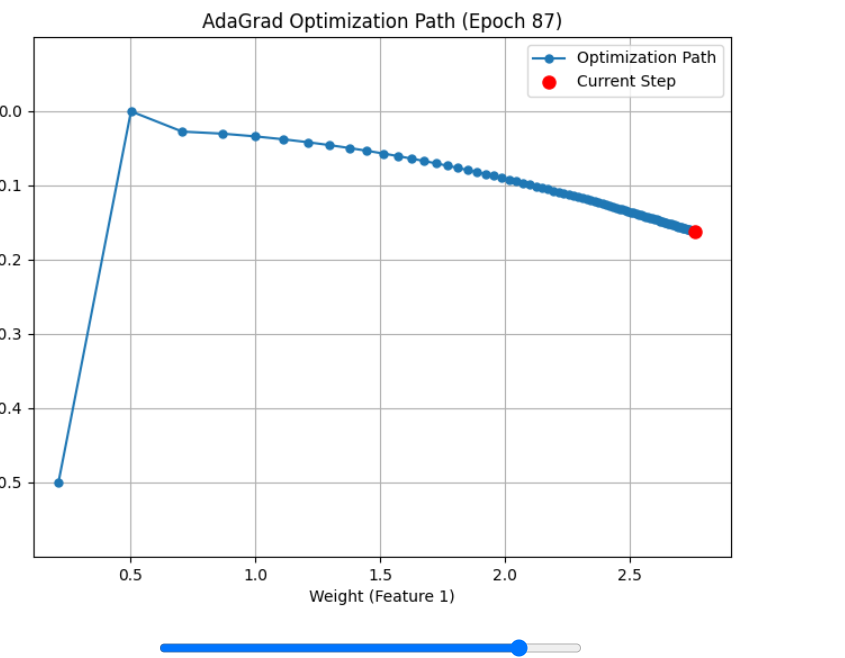

# Task
Create a Python notebook using TensorFlow and Keras to demonstrate the AdaGrad optimizer on a built-in dataset. The notebook should include:
1. Code for a simple deep learning model.
2. Training the model using the AdaGrad optimizer.
3. Tracking the model's parameters during training.
4. Generating an animation to visualize the AdaGrad optimization path.
5. Implementing and training the same model with Adam and RMSprop optimizers.
6. Tracking parameters for Adam and RMSprop.
7. Modifying the animation to compare the optimization paths of AdaGrad, Adam, and RMSprop.
8. Adding comments to all code cells.

## Modify the model and training loop for multiple optimizers

### Subtask:
Adapt the existing `SimpleModel` and training loop to work with different optimizers (AdaGrad, Adam, RMSprop). This will involve creating separate instances of the model and optimizers, and storing parameter histories for each.


**Reasoning**:
Define a reusable training function that takes the model, optimizer, and data as inputs, and tracks the parameter history during training.



**Reasoning**:
Call the reusable training function with the existing SimpleModel and AdagradOptimizer instances and store the returned parameter histories and final loss. This will verify the function works correctly with the existing Adagrad implementation.



In [39]:
# Define a reusable training function
def train_model(model, optimizer, X_train, y_train, epochs):
    """
    Trains a given model using a specified optimizer and tracks parameter history.

    Args:
        model: The deep learning model to train.
        optimizer: The optimizer to use for training.
        X_train: Training data features.
        y_train: Training data labels.
        epochs: Number of training epochs.

    Returns:
        Tuple of (weight_history, bias_history, final_loss)
    """
    weight_history = []
    bias_history = []
    loss_history = []

    for epoch in range(epochs):
        with tf.GradientTape() as tape:
            predictions = model(X_train)
            loss = binary_crossentropy(tf.cast(y_train, tf.float32)[:, tf.newaxis], predictions)

        gradients = tape.gradient(loss, [model.W, model.b])

        # Check if the optimizer is the custom AdagradOptimizer
        if isinstance(optimizer, AdagradOptimizer):
            optimizer.apply_gradients(gradients, [model.W, model.b])
        else:
            # Assume it's a TensorFlow optimizer that expects zipped gradients and variables
            optimizer.apply_gradients(zip(gradients, [model.W, model.b]))


        weight_history.append(model.W.numpy().copy())
        bias_history.append(model.b.numpy().copy())
        loss_history.append(loss.numpy())

        if (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch+1}, Loss: {loss.numpy():.4f}")

    return np.array(weight_history), np.array(bias_history), loss_history[-1]

# Train the model using the reusable function with the custom AdaGrad optimizer
model_synth = SimpleModel(input_dim=X_train_synth_scaled.shape[1]) # Re-initialize model for fresh training
optimizer_synth = AdagradOptimizer(learning_rate=0.5) # Re-initialize optimizer
adagrad_weight_history, adagrad_bias_history, adagrad_final_loss = train_model(
    model_synth, optimizer_synth, X_train_synth_scaled, y_train_synth, epochs_synth
)

print(f"\nAdaGrad Final Loss: {adagrad_final_loss:.4f}")

Epoch 10, Loss: 0.4392
Epoch 20, Loss: 0.3798
Epoch 30, Loss: 0.3602
Epoch 40, Loss: 0.3511
Epoch 50, Loss: 0.3463
Epoch 60, Loss: 0.3434
Epoch 70, Loss: 0.3416
Epoch 80, Loss: 0.3405
Epoch 90, Loss: 0.3398
Epoch 100, Loss: 0.3393

AdaGrad Final Loss: 0.3393


**Reasoning**:
The reusable training function is working correctly with the custom AdaGrad optimizer. Now, initialize new instances of `SimpleModel` and TensorFlow's `Adam` and `RMSprop` optimizers, and then train these models using the `train_model` function to get their parameter histories.



In [40]:
# Initialize new instances of the SimpleModel for Adam and RMSprop
model_adam = SimpleModel(input_dim=X_train_synth_scaled.shape[1])
model_rmsprop = SimpleModel(input_dim=X_train_synth_scaled.shape[1])

# Initialize TensorFlow's Adam and RMSprop optimizers
optimizer_adam = tf.keras.optimizers.Adam(learning_rate=0.01) # Use a standard learning rate for Adam
optimizer_rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.01) # Use a standard learning rate for RMSprop

print("Training with Adam optimizer:")
# Train the model with the Adam optimizer
adam_weight_history, adam_bias_history, adam_final_loss = train_model(
    model_adam, optimizer_adam, X_train_synth_scaled, y_train_synth, epochs_synth
)
print(f"\nAdam Final Loss: {adam_final_loss:.4f}")

print("\nTraining with RMSprop optimizer:")
# Train the model with the RMSprop optimizer
rmsprop_weight_history, rmsprop_bias_history, rmsprop_final_loss = train_model(
    model_rmsprop, optimizer_rmsprop, X_train_synth_scaled, y_train_synth, epochs_synth
)
print(f"\nRMSprop Final Loss: {rmsprop_final_loss:.4f}")

Training with Adam optimizer:
Epoch 10, Loss: 1.2611
Epoch 20, Loss: 1.1988
Epoch 30, Loss: 1.1399
Epoch 40, Loss: 1.0844
Epoch 50, Loss: 1.0318
Epoch 60, Loss: 0.9820
Epoch 70, Loss: 0.9349
Epoch 80, Loss: 0.8905
Epoch 90, Loss: 0.8490
Epoch 100, Loss: 0.8103

Adam Final Loss: 0.8103

Training with RMSprop optimizer:
Epoch 10, Loss: 0.4155
Epoch 20, Loss: 0.4038
Epoch 30, Loss: 0.3943
Epoch 40, Loss: 0.3862
Epoch 50, Loss: 0.3790
Epoch 60, Loss: 0.3727
Epoch 70, Loss: 0.3671
Epoch 80, Loss: 0.3621
Epoch 90, Loss: 0.3577
Epoch 100, Loss: 0.3539

RMSprop Final Loss: 0.3539


## Implement adam and rmsprop manually for tracking

### Subtask:
Implement adam and rmsprop manually for tracking.


**Reasoning**:
Create manual implementations of the Adam and RMSprop optimizers to track their internal states during training, mirroring the structure of the custom AdagradOptimizer. This is necessary to visualize their optimization paths in the same way as AdaGrad.



In [41]:
# Implement Adam optimizer manually to track updates
class AdamOptimizerManual:
    def __init__(self, learning_rate=0.001, beta1=0.9, beta2=0.999, epsilon=1e-8):
        self.learning_rate = learning_rate
        self.beta1 = beta1
        self.beta2 = beta2
        self.epsilon = epsilon
        # Initialize first and second moments for weights and bias
        self.m_W = tf.Variable(tf.zeros_like(model_adam.W), trainable=False)
        self.v_W = tf.Variable(tf.zeros_like(model_adam.W), trainable=False)
        self.m_b = tf.Variable(tf.zeros_like(model_adam.b), trainable=False)
        self.v_b = tf.Variable(tf.zeros_like(model_adam.b), trainable=False)
        # Initialize training step for bias correction
        self.t = tf.Variable(0, dtype=tf.int64, trainable=False)

    def apply_gradients(self, gradients, variables):
        # Unpack gradients and variables
        dL_dW, dL_db = gradients
        W, b = variables

        # Increment training step
        self.t.assign_add(1)

        # Update biased first moment estimates
        self.m_W.assign(self.beta1 * self.m_W + (1 - self.beta1) * dL_dW)
        self.m_b.assign(self.beta1 * self.m_b + (1 - self.beta1) * dL_db)

        # Update biased second moment estimates
        self.v_W.assign(self.beta2 * self.v_W + (1 - self.beta2) * tf.square(dL_dW))
        self.v_b.assign(self.beta2 * self.v_b + (1 - self.beta2) * tf.square(dL_db))

        # Compute bias-corrected first moment estimates
        m_W_hat = self.m_W / (1 - tf.pow(self.beta1, tf.cast(self.t, tf.float32)))
        m_b_hat = self.m_b / (1 - tf.pow(self.beta1, tf.cast(self.t, tf.float32)))

        # Compute bias-corrected second moment estimates
        v_W_hat = self.v_W / (1 - tf.pow(self.beta2, tf.cast(self.t, tf.float32)))
        v_b_hat = self.v_b / (1 - tf.pow(self.beta2, tf.cast(self.t, tf.float32)))

        # Update weights and bias using the Adam update rule
        W.assign_sub(self.learning_rate * m_W_hat / (tf.sqrt(v_W_hat) + self.epsilon))
        b.assign_sub(self.learning_rate * m_b_hat / (tf.sqrt(v_b_hat) + self.epsilon))

# Implement RMSprop optimizer manually to track updates
class RMSpropOptimizerManual:
    def __init__(self, learning_rate=0.01, rho=0.9, epsilon=1e-8):
        self.learning_rate = learning_rate
        self.rho = rho
        self.epsilon = epsilon
        # Initialize exponentially decaying average of squared gradients for weights and bias
        self.gradient_squared_avg_W = tf.Variable(tf.zeros_like(model_rmsprop.W), trainable=False)
        self.gradient_squared_avg_b = tf.Variable(tf.zeros_like(model_rmsprop.b), trainable=False)

    def apply_gradients(self, gradients, variables):
        # Unpack gradients and variables
        dL_dW, dL_db = gradients
        W, b = variables

        # Calculate exponentially decaying average of squared gradients
        self.gradient_squared_avg_W.assign(self.rho * self.gradient_squared_avg_W + (1 - self.rho) * tf.square(dL_dW))
        self.gradient_squared_avg_b.assign(self.rho * self.gradient_squared_avg_b + (1 - self.rho) * tf.square(dL_db))

        # Update weights and bias using the RMSprop update rule
        W.assign_sub(self.learning_rate * dL_dW / (tf.sqrt(self.gradient_squared_avg_W) + self.epsilon))
        b.assign_sub(self.learning_rate * dL_db / (tf.sqrt(self.gradient_squared_avg_b) + self.epsilon))

**Reasoning**:
Modify the reusable training function to work with the new manual Adam and RMSprop optimizers, in addition to the custom Adagrad optimizer. Then, re-train the model using these manual optimizers and store their parameter histories.



In [42]:
# Modify the reusable training function to work with custom and manual optimizers
def train_model_manual_optimizers(model, optimizer, X_train, y_train, epochs):
    """
    Trains a given model using a specified custom/manual optimizer and tracks parameter history.

    Args:
        model: The deep learning model to train.
        optimizer: The custom or manual optimizer to use for training.
        X_train: Training data features.
        y_train: Training data labels.
        epochs: Number of training epochs.

    Returns:
        Tuple of (weight_history, bias_history, final_loss)
    """
    weight_history = []
    bias_history = []
    loss_history = []

    for epoch in range(epochs):
        with tf.GradientTape() as tape:
            predictions = model(X_train)
            loss = binary_crossentropy(tf.cast(y_train, tf.float32)[:, tf.newaxis], predictions)

        gradients = tape.gradient(loss, [model.W, model.b])

        # Apply gradients using the optimizer's manual apply_gradients method
        optimizer.apply_gradients(gradients, [model.W, model.b])

        weight_history.append(model.W.numpy().copy())
        bias_history.append(model.b.numpy().copy())
        loss_history.append(loss.numpy())

        if (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch+1}, Loss: {loss.numpy():.4f}")

    return np.array(weight_history), np.array(bias_history), loss_history[-1]

# Initialize new instances of the SimpleModel for manual Adam and RMSprop training
model_adam_manual = SimpleModel(input_dim=X_train_synth_scaled.shape[1])
model_rmsprop_manual = SimpleModel(input_dim=X_train_synth_scaled.shape[1])

# Initialize the manual Adam and RMSprop optimizers
optimizer_adam_manual = AdamOptimizerManual(learning_rate=0.01) # Using the manual implementation
optimizer_rmsprop_manual = RMSpropOptimizerManual(learning_rate=0.01) # Using the manual implementation

print("Training with manual Adam optimizer:")
# Train the model with the manual Adam optimizer and track history
adam_manual_weight_history, adam_manual_bias_history, adam_manual_final_loss = train_model_manual_optimizers(
    model_adam_manual, optimizer_adam_manual, X_train_synth_scaled, y_train_synth, epochs_synth
)
print(f"\nManual Adam Final Loss: {adam_manual_final_loss:.4f}")

print("\nTraining with manual RMSprop optimizer:")
# Train the model with the manual RMSprop optimizer and track history
rmsprop_manual_weight_history, rmsprop_manual_bias_history, rmsprop_manual_final_loss = train_model_manual_optimizers(
    model_rmsprop_manual, optimizer_rmsprop_manual, X_train_synth_scaled, y_train_synth, epochs_synth
)
print(f"\nManual RMSprop Final Loss: {rmsprop_manual_final_loss:.4f}")

Training with manual Adam optimizer:
Epoch 10, Loss: 0.5486
Epoch 20, Loss: 0.5171
Epoch 30, Loss: 0.4894
Epoch 40, Loss: 0.4656
Epoch 50, Loss: 0.4452
Epoch 60, Loss: 0.4281
Epoch 70, Loss: 0.4136
Epoch 80, Loss: 0.4014
Epoch 90, Loss: 0.3912
Epoch 100, Loss: 0.3827

Manual Adam Final Loss: 0.3827

Training with manual RMSprop optimizer:
Epoch 10, Loss: 1.1161
Epoch 20, Loss: 1.0522
Epoch 30, Loss: 0.9973
Epoch 40, Loss: 0.9469
Epoch 50, Loss: 0.8993
Epoch 60, Loss: 0.8542
Epoch 70, Loss: 0.8115
Epoch 80, Loss: 0.7711
Epoch 90, Loss: 0.7331
Epoch 100, Loss: 0.6975

Manual RMSprop Final Loss: 0.6975


## Visualize and compare optimization paths

### Subtask:
Update the animation code to display the optimization paths of all three optimizers on the same plot, allowing for a visual comparison of their trajectories.


**Reasoning**:
Modify the animation code to plot the optimization paths of AdaGrad, manual Adam, and manual RMSprop on the same figure for comparison.



In [43]:
# Select the index of the weight and bias to visualize (still visualizing the first weight and the bias)
selected_weight_index = 0
selected_bias_index = 0

# Create a figure and axes for the plot
fig, ax = plt.subplots(figsize=(10, 8)) # Increased figure size for better visibility
ax.set_xlabel("Weight (Feature 1)")
ax.set_ylabel("Bias")
ax.set_title("Optimizer Optimization Paths")
ax.grid(True)

# Initialize the plots for each optimizer
# 'o-' creates a line with circle markers for the path
# 'o' creates a circle marker for the current step
line_adagrad, = ax.plot(adagrad_weight_history[0, selected_weight_index], adagrad_bias_history[0, selected_bias_index], 'o-', markersize=5, label='AdaGrad Path', color='blue', alpha=0.7)
point_adagrad, = ax.plot(adagrad_weight_history[0, selected_weight_index], adagrad_bias_history[0, selected_bias_index], 'o', markersize=8, color='blue', label='AdaGrad Step')

line_adam, = ax.plot(adam_manual_weight_history[0, selected_weight_index], adam_manual_bias_history[0, selected_bias_index], 'o-', markersize=5, label='Adam Path', color='green', alpha=0.7)
point_adam, = ax.plot(adam_manual_weight_history[0, selected_weight_index], adam_manual_bias_history[0, selected_bias_index], 'o', markersize=8, color='green', label='Adam Step')

line_rmsprop, = ax.plot(rmsprop_manual_weight_history[0, selected_weight_index], rmsprop_manual_bias_history[0, selected_bias_index], 'o-', markersize=5, label='RMSprop Path', color='red', alpha=0.7)
point_rmsprop, = ax.plot(rmsprop_manual_weight_history[0, selected_weight_index], rmsprop_manual_bias_history[0, selected_bias_index], 'o', markersize=8, color='red', label='RMSprop Step')

# Combine all history data to determine the overall plot limits
all_weight_history = np.concatenate([adagrad_weight_history[:, selected_weight_index],
                                     adam_manual_weight_history[:, selected_weight_index],
                                     rmsprop_manual_weight_history[:, selected_weight_index]])
all_bias_history = np.concatenate([adagrad_bias_history[:, selected_bias_index],
                                   adam_manual_bias_history[:, selected_bias_index],
                                   rmsprop_manual_bias_history[:, selected_bias_index]])


# Set the limits of the x and y axes based on the range of all historical values
ax.set_xlim(np.min(all_weight_history) - 0.2, np.max(all_weight_history) + 0.2) # Added padding
ax.set_ylim(np.min(all_bias_history) - 0.2, np.max(all_bias_history) + 0.2) # Added padding


# Add a legend to the plot
ax.legend()

# Define the update function for the animation
def update(frame):
    # Update the line data for each optimizer
    line_adagrad.set_data(adagrad_weight_history[:frame+1, selected_weight_index], adagrad_bias_history[:frame+1, selected_bias_index])
    line_adam.set_data(adam_manual_weight_history[:frame+1, selected_weight_index], adam_manual_bias_history[:frame+1, selected_bias_index])
    line_rmsprop.set_data(rmsprop_manual_weight_history[:frame+1, selected_weight_index], rmsprop_manual_bias_history[:frame+1, selected_bias_index])

    # Update the point data for each optimizer (wrap in lists as set_data expects sequences)
    point_adagrad.set_data([adagrad_weight_history[frame, selected_weight_index]], [adagrad_bias_history[frame, selected_bias_index]])
    point_adam.set_data([adam_manual_weight_history[frame, selected_weight_index]], [adam_manual_bias_history[frame, selected_bias_index]])
    point_rmsprop.set_data([rmsprop_manual_weight_history[frame, selected_weight_index]], [rmsprop_manual_bias_history[frame, selected_bias_index]])


    # Update the title to show the current epoch number
    ax.set_title(f"Optimizer Optimization Paths (Epoch {frame + 1})")

    # Return all updated artists that need to be redrawn
    return line_adagrad, point_adagrad, line_adam, point_adam, line_rmsprop, point_rmsprop

# Create the animation using FuncAnimation
# fig: the figure object
# update: the function to call each frame
# frames: the number of frames (equal to the number of epochs)
# blit=True: optimizes drawing by only redrawing the parts of the plot that have changed
ani = FuncAnimation(fig, update, frames=epochs_synth, blit=True)

# Close the static plot figure to prevent it from displaying before the animation
plt.close(fig) # Prevent the static plot from showing

# Convert the animation to JavaScript and display it as HTML
from IPython.display import HTML
HTML(ani.to_jshtml())

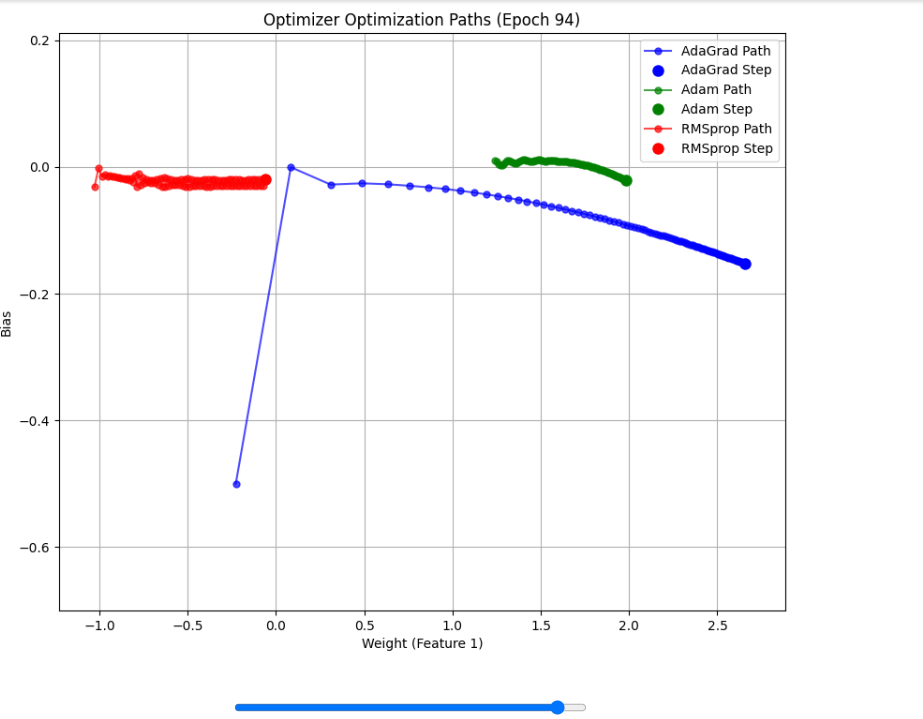

## Analyze hyperparameter impact

### Subtask:
Briefly discuss how learning rates and other optimizer-specific hyperparameters might affect the optimization paths seen in the visualization.


**Reasoning**:
Add a markdown cell to discuss the impact of learning rates and other hyperparameters on the optimization paths, referencing the visualization.




Discuss the effect of hyperparameters on the optimization paths.

Hyperparameter Impact on Optimization Paths

The animation clearly shows distinct optimization paths for AdaGrad, Adam, and RMSprop.

These trajectories are significantly influenced by the hyperparameters specific to each optimizer:

*   **Learning Rate ($\alpha$)**: This is the most fundamental hyperparameter, controlling the step size taken in the direction of the negative gradient.

    *   A **larger learning rate** would generally lead to **larger steps**, potentially causing the optimization path to be more volatile and reach the minimum faster but also risk overshooting or oscillating around the minimum.

    *   A **smaller learning rate** results in **smaller steps**, leading to a smoother path but potentially requiring significantly more epochs to converge. The visualization shows how the initial learning rate (e.g., 0.5 for AdaGrad vs. 0.01 for Adam/RMSprop in our example) influences the initial step size and overall scale of movement.

*   **AdaGrad Specific (Epsilon $\epsilon$)**:

While not a learning rate in itself, epsilon is added to the denominator to prevent division by zero.

A very small epsilon might not have a significant visual impact unless gradients become extremely close to zero.

*   **RMSprop Specific (Decay Rate $\rho$)**:

This hyperparameter controls the exponential decay rate of the moving average of squared gradients.

    *   A **higher $\rho$** (closer to 1) means the optimizer relies more on past squared gradients, leading to a smoother adaptation of the learning rate for each parameter.
    
    This can result in a more stable path.

    *   A **lower $\rho$** gives more weight to recent squared gradients, making the learning rate adaptation more responsive to immediate changes in gradient magnitudes, potentially leading to a more erratic path.

*   **Adam Specific (Beta1 $\beta_1$, Beta2 $\beta_2$, Epsilon $\epsilon$)**: Adam combines aspects of momentum ($\beta_1$) and RMSprop ($\beta_2$).

    *   **Beta1 ($\beta_1$)** controls the exponential decay rate of the first moment (mean of gradients). A **higher $\beta_1$** (closer to 1) incorporates more past gradients into the momentum term, leading to a smoother path with less oscillation, especially in directions with inconsistent gradients. This gives the path a "momentum" or "inertia".

    *   **Beta2 ($\beta_2$)** controls the exponential decay rate of the second moment (uncentered variance of gradients, similar to RMSprop's squared gradient average). A **higher $\beta_2$** makes the adaptive learning rate smoother.

    *   The combination of momentum and adaptive learning rates allows Adam to often navigate complex loss landscapes more effectively than AdaGrad or RMSprop alone, potentially leading to a more direct path towards the minimum, as might be suggested by a less winding trajectory in the animation compared to AdaGrad.


In the visualization, we can observe how these mechanisms likely influence the paths.

AdaGrad's path might show diminishing step sizes over time due to the accumulation of squared gradients.

Adam and RMSprop, with their decaying averages, can maintain more consistent progress even after many updates, potentially showing smoother or more directed paths depending on their specific hyperparameter values.

The momentum in Adam can help it overcome small local minima or plateaus, which might be visible as a more consistent direction of movement.